# Deep Learning and Image Processing
This jupyter notebook implements the following tasks:
1. Saliency Maps
2. Fooling Images
3. Style Transfer

In [1]:
# Loading packages
import PIL
import numpy as np
import matplotlib.pyplot as plt

import torch
import torchvision
import torch.autograd as autograd
import torchvision.transforms as T

## Pretrained Model

For this project, you will use a pre-trained deep neural network, [SqueezeNet](https://arxiv.org/abs/1602.07360), which is lightweight and runs fast on CPUs. Run the code below to load a pre-trained SqueezeNet from the PyTorch official model zoo.

In [2]:
# Download and load the pretrained SqueezeNet model.
model = torchvision.models.squeezenet1_1(pretrained=True)
# Disable the gradient computation with respect to model parameters.
for param in model.parameters():
    param.requires_grad = False

## Data
For Task#1 and Task#2, use the images in folder `images` where the filenames are the corresponding class labels. For example, `182.png` is an image of Border Terrier, which is class 182 in ImageNet dataset. Please refer to [this Gist snippet](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a) for a complete list. The images are from ImageNet validation set, and so the pre-trained model has never "seen" them.

For Task#3, you may use the images in folder `style` or any other images you like.

## Helper Functions

Most pre-trained models are trained on images that had been preprocessed by subtracting the per-color mean and dividing by the per-color standard deviation. Here are a few helper functions for performing and undoing this preprocessing.

In [3]:
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD = np.array([0.229, 0.224, 0.225])

def preprocess(img, size=(224, 224)):
    transform = T.Compose([
        T.Resize(size),
        T.ToTensor(),
        T.Normalize(mean=IMAGENET_MEAN.tolist(),
                    std=IMAGENET_STD.tolist()),
        T.Lambda(lambda x: x[None]),
    ])
    return transform(img)

def deprocess(img, should_rescale=True):
    transform = T.Compose([
        T.Lambda(lambda x: x[0]),
        T.Normalize(mean=[0, 0, 0], std=(1.0 / IMAGENET_STD).tolist()),
        T.Normalize(mean=(-IMAGENET_MEAN).tolist(), std=[1, 1, 1]),
        T.Lambda(rescale) if should_rescale else T.Lambda(lambda x: x),
        T.ToPILImage(),
    ])
    return transform(img)

def rescale(x):
    low, high = x.min(), x.max()
    x_rescaled = (x - low) / (high - low)
    return x_rescaled

# Task#1 Saliency Maps

Saliency maps are a quick way to tell which part of the image influenced the classification decision made by the network. Using this pretrained model, you need to compute class saliency maps as described in the following paper:

[1] [Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising
Image Classification Models and Saliency Maps", ICLR Workshop 2014.](https://arxiv.org/abs/1312.6034)

A **saliency map** tells us the degree to which each pixel in the image affects the classification score for that image and is obtained by evaluating the gradient of the unnormalized score corresponding to the correct class (which is a scalar) with respect to the pixels of the image.

Implement the function `compute_saliency_maps` below, and then use it to compute the saliency maps for images in folder `Project1/images`. Next, save the generated saliency maps in `Project1/saliency` using the same filenames as the images. You may refer to the generated example in `Project1/saliency`.

In [4]:
def compute_saliency_maps(X, y, model):
    """
    Compute a class saliency map using the model for images X and labels y.

    Input:
    - X: Input images; Tensor of shape (N, 3, H, W)
    - y: Labels for X; LongTensor of shape (N,)
    - model: A pretrained CNN that will be used to compute the saliency map.

    Returns:
    - saliency: A Tensor of shape (N, H, W) giving the saliency maps for the input
    images.
    """
    # Make sure the model is in "test" mode
    model.eval()
    
    # Set the gradient computation flag
    X.requires_grad=True
    y.requires_grad=False
    saliency = None
    
    ##############################################################################
    # TODO: Implement this function. Perform a forward and backward pass through #
    # the model to compute the gradient of the correct class score with respect  #
    # to each input image.                                                       #
    ##############################################################################
    # your code
    all_scores = model(X)    #all_scores contains the unnormalized score for each class
    scores = all_scores.gather(1, y.view(-1,1)).squeeze()
    
    scores.backward(torch.FloatTensor([1.0]*X.shape[0]))
    
    saliency = X.grad.data
    # input in RGD, need to convert saliency to grayscale
    saliency, i = torch.max(saliency, dim=1)
    saliency = saliency.squeeze()
    ##############################################################################
    #                             END OF YOUR CODE                               #
    ##############################################################################
    return saliency.abs()

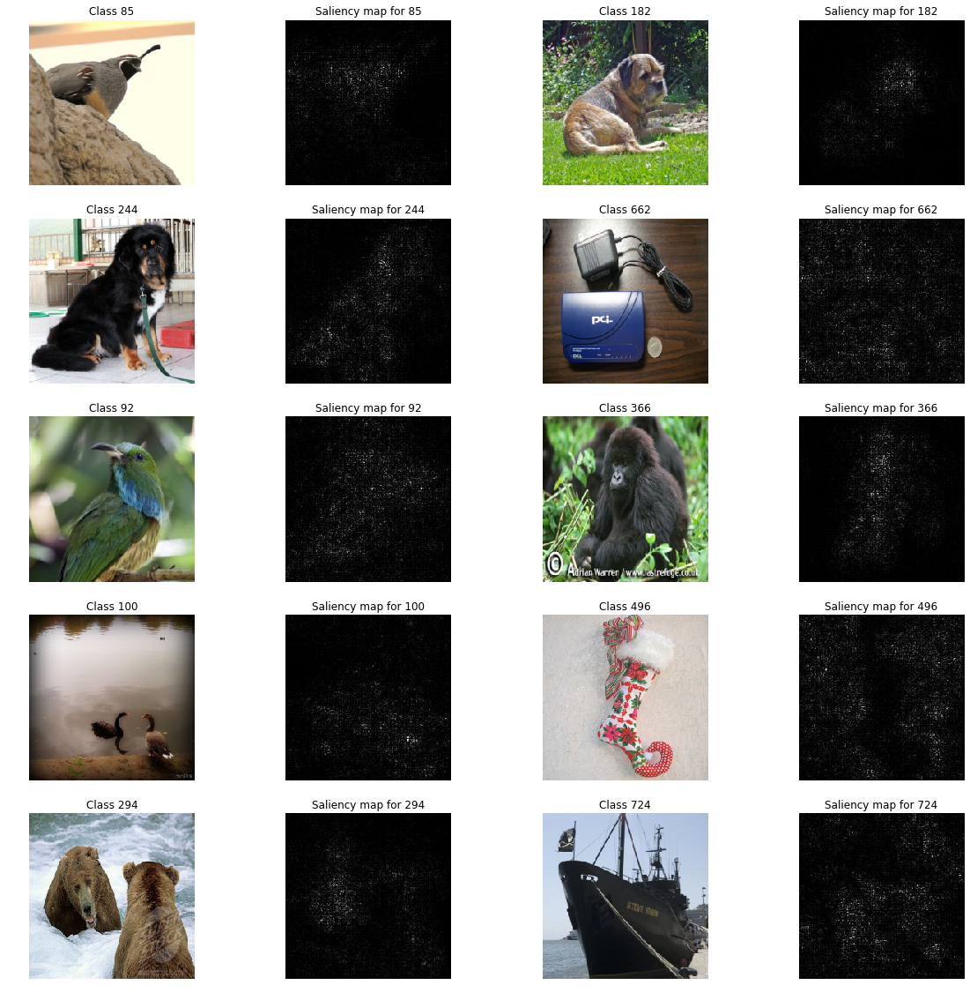

In [5]:
# Compute the saliency maps for the images under `Project1/images`
import glob

image_list = []
y_list = []
for filename in glob.glob('images/*.png'):
    im=PIL.Image.open(filename)
    image_list.append(im)
    y_list.append(int(filename.split('/')[1].split('.')[0]))
    
X = torch.cat([preprocess(im) for im in image_list], dim=0)
y = torch.LongTensor(y_list)

saliency = compute_saliency_maps(X, y, model)

saliency = saliency.numpy()
N = X.shape[0]


# Plotting images
fig, ax = plt.subplots(N//2, 4, figsize=(20,20))
[axi.set_axis_off() for axi in ax.ravel()]
for i in range(N//2):
    ax[i,0].imshow(image_list[i])
    ax[i,0].set_title('Class {}'.format(y_list[i]))
    ax[i,1].imshow(saliency[i], cmap=plt.cm.gray)
    ax[i,1].set_title('Saliency map for {}'.format(y_list[i]))
    
    ax[i,2].imshow(image_list[N//2+i])
    ax[i,2].set_title('Class {}'.format(y_list[N//2+i]))
    ax[i,3].imshow(saliency[N//2+i], cmap='gray')
    ax[i,3].set_title('Saliency map for {}'.format(y_list[N//2+i]))

    
# Save images in 'saliency/'
for i in range(len(saliency)):
    pil_im = PIL.Image.fromarray(np.uint8(plt.cm.gist_earth(saliency[i])*255)).convert("L")
    pil_im.save("saliency/{}.png".format(y_list[i]),"PNG")

# Task#2 Fooling Images

The concept of "image gradients" can be used to study the stability of a network. Consider a state-of-the-art deep neural network that generalizes well on an object recognition task. We expect such network to be robust to small perturbations to its input, because small perturbations cannot change the object category of an image. However, it was shown in the following paper[2] that by applying an imperceptible non-random perturbation to a test image, it is possible to arbitrarily change the network’s prediction.

[2] [Szegedy et al, "Intriguing properties of neural networks", ICLR 2014](https://arxiv.org/abs/1312.6199)

Given an image and a target class, we can perform **gradient ascent** over the image to maximize the target class, stopping when the network classifies the image as the target class. While the perturbations seem negligible to humans, the network would classify the perturbed images wrongly.

Read the paper, and then implement the following function `make_fooling_image` to generate "fooling images". For each image in `Project1/images` with class label $c$, generate a fooling image that will be classified into class $ c-1-d $ where $d$ is the last digit of your student number. Save each fooling image into the folder `Project1/fooling_images` with the filename `{true_class}_{target_class}.png`. You may confirm (optional) that the fooling image 182_9.png in the folder will be wrongly classified as ostrich (class 9 in ImageNet dataset).

In [6]:
def make_fooling_image(X, target_y, model):
    """
    Generate a fooling image that is close to X, but that the model classifies
    as target_y.

    Inputs:
    - X: Input image; Tensor of shape (1, 3, 224, 224)
    - target_y: An integer in the range [0, 1000)
    - model: A pretrained CNN

    Returns:
    - X_fooling: An image that is close to X, but that is classifed as target_y
    by the model.
    """
    
    model.eval()
    
    # Initialize our fooling image to the input image
    X_fooling = X.clone().detach()
    X_fooling.requires_grad = True

    # you may change the learning rate and max_iter
    learning_rate = 10 # learning rate is 1
    max_iter = 200 # maximum number of iterations
    
    for it in range(max_iter):
        ##############################################################################
        # TODO: Generate a fooling image X_fooling that the model will classify as   #
        # the class target_y. You should perform gradient ascent on the score of the #
        # target class, stopping when the model is fooled.                           #
        # When computing an update step, first normalize the gradient:               #
        #   dX = learning_rate * g / ||g||_2                                         #
        ##############################################################################
        # your code
        scores = model(X_fooling)
        _, label = scores.data.max(dim=1)
        
        if label[0] == target_y:    #model fooled
            break
        
        target_score = scores[0,target_y]
        target_score.backward()
        
        Xfool_grad = X_fooling.grad.data
        
        X_fooling.data += learning_rate * (Xfool_grad/Xfool_grad.norm())        
        ##############################################################################
        #                             END OF YOUR CODE                               #
        ##############################################################################
    
    X_fooling = X_fooling.detach()
    
    return X_fooling

Image of class 85 classified as class 77
Image of class 244 classified as class 236
Image of class 92 classified as class 84
Image of class 100 classified as class 92
Image of class 294 classified as class 286
Image of class 182 classified as class 174
Image of class 662 classified as class 654
Image of class 366 classified as class 358
Image of class 496 classified as class 488
Image of class 724 classified as class 716


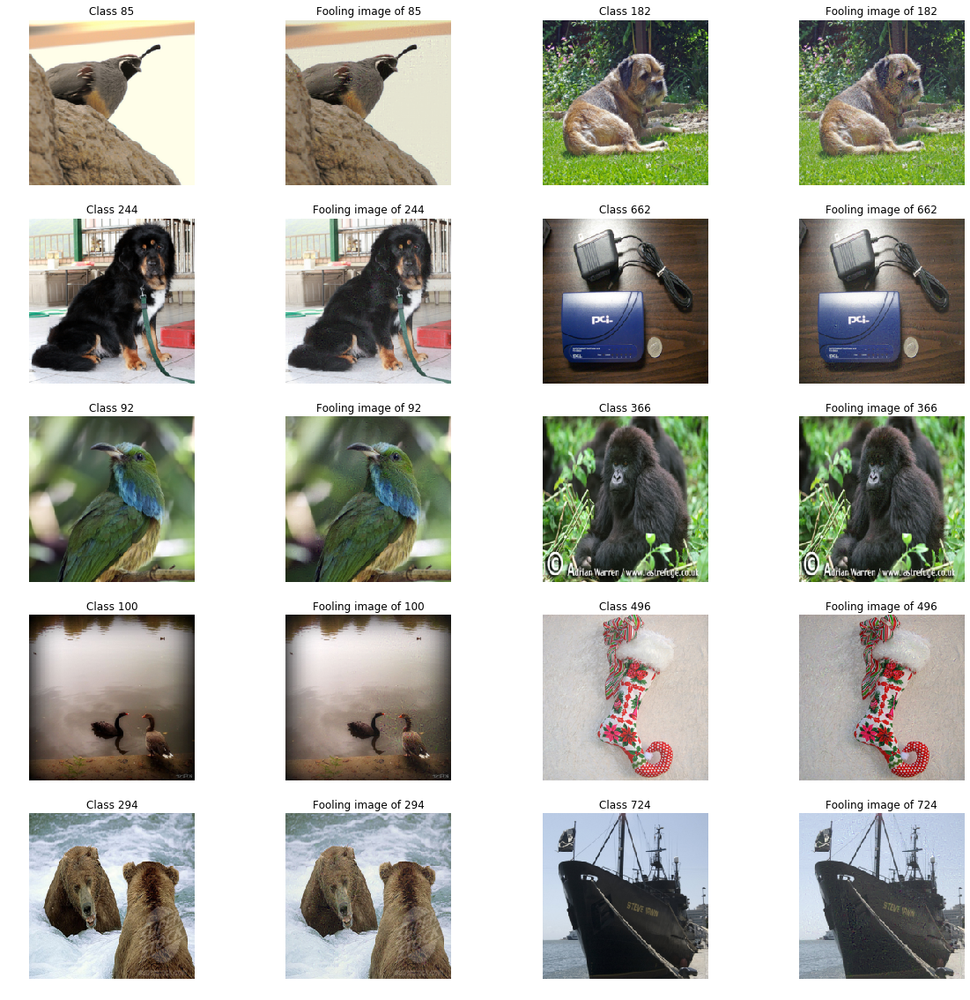

In [7]:
# Compute the fooling images for the images under `images`
X_fooling = []
for idx in range(len(image_list)):
    target_y = y_list[idx] - 8 # force the network to predict the class 8 IDs below
    X_fooling.append(make_fooling_image(X[idx:idx+1], target_y, model))
    scores = model(X_fooling[idx])
    print('Image of class {} classified as class {}'.format(y_list[idx], scores.data.max(1)[1][0]))
    
# Plotting images
fig, ax = plt.subplots(N//2, 4, figsize=(20,20))
[axi.set_axis_off() for axi in ax.ravel()]
for i in range(N//2):
    ax[i,0].imshow(image_list[i])
    ax[i,0].set_title('Class {}'.format(y_list[i]))
    ax[i,1].imshow(deprocess(X_fooling[i]))
    ax[i,1].set_title('Fooling image of {}'.format(y_list[i]))
    
    ax[i,2].imshow(image_list[N//2+i])
    ax[i,2].set_title('Class {}'.format(y_list[N//2+i]))
    ax[i,3].imshow(deprocess(X_fooling[N//2+i]))
    ax[i,3].set_title('Fooling image of {}'.format(y_list[N//2+i]))
    
# Save images in 'saliency/'
for i in range(len(saliency)):
    pil_im = deprocess(X_fooling[i])
    pil_im.save("fooling_images/{}_{}.png".format(y_list[i], y_list[i]-1-7),"PNG")

# Task#3 Style Transfer

Another task which is closely related to image gradients is style transfer which has become a "cool" application in deep learning for computer vision applications. You need to study and implement the style transfer technique presented in the following paper where the general idea is to take two images (a content image and a style image), and produce a new image that reflects the content of one but the artistic "style" of the other.

[3] [Gatys, Leon A., Alexander S. Ecker, and Matthias Bethge. "Image style transfer using convolutional neural networks." Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition. 2016.](http://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf)

Below is an example.

![](example.png)

## Compute the loss

To perform style transfer, you will need to first fomulate a special loss function that matches the content and style of each respective image in the feature space, and then perform gradient descent on the pixels of the image itself.

The loss function contains two parts: **content loss** and **style loss**. Read the paper for details about the losses and implement them below.

In [8]:
def content_loss(content_weight, content_current, content_original):
    """
    Compute the content loss for style transfer.
    
    Inputs:
    - content_weight: Scalar giving the weighting for the content loss.
    - content_current: features of the current image; this is a PyTorch Tensor of shape
      (1, C_l, H_l, W_l).
    - content_target: features of the content image, Tensor with shape (1, C_l, H_l, W_l).
    
    Returns:
    - scalar content loss
    """
    
    ##############################################################################
    # TODO: Implement content loss function                                      #
    # Note: It should not be very much code (less than 10 lines)                 #
    ##############################################################################
    # your code
    squared_diff = torch.sub(content_current, content_original)**2
    content_loss = content_weight * torch.sum(squared_diff)
    
    return content_loss
    ##############################################################################
    #                             END OF YOUR CODE                               #
    ##############################################################################


def gram_matrix(features):
    """
    Compute the normalized Gram matrix from features.
    The Gram matrix will be used to compute style loss.
    
    Inputs:
    - features: PyTorch Tensor of shape (N, C, H, W) giving features for
      a batch of N images.
    
    Returns:
    - gram: PyTorch Tensor of shape (N, C, C) giving the
      normalized Gram matrices for the N input images.
    """    
    ##############################################################################
    # TODO: Implement the normalized Gram matrix compuation function             #
    # Note: It should not be very much code (less than 10 lines)                 #
    ##############################################################################
    # your code
    N, C, H, W = features.size()
    gram = torch.Tensor()
    for i in range(N):
        F = features[i,:,:,:].view(1,C, H*W)
        gram_n = torch.mm(F[0,:,:], F[0,:,:].transpose(1,0)).unsqueeze(0)
        gram_n /= (H*W*C)
        gram = torch.cat([gram, gram_n])
    
    return gram
    ##############################################################################
    #                             END OF YOUR CODE                               #
    ##############################################################################


def style_loss(feats, style_layers, style_targets, style_weights):
    """
    Computes the style loss at a set of layers.
    
    Inputs:
    - feats: list of the features at every layer of the current image.
    - style_layers: List of layer indices into feats giving the layers to include in the
      style loss.
    - style_targets: List of the same length as style_layers, where style_targets[i] is
      a PyTorch Variable giving the Gram matrix of the source style image computed at
      layer style_layers[i].
    - style_weights: List of the same length as style_layers, where style_weights[i]
      is a scalar giving the weight for the style loss at layer style_layers[i].
      
    Returns:
    - style_loss: A PyTorch Tensor holding a scalar giving the style loss.
    """
    
    ##############################################################################
    # TODO: Implement content loss function                                      #
    # Note: It should not be very much code (less than 10 lines)                 #
    ##############################################################################
    # your code
    loss = torch.zeros(1)
    
    for i,l in enumerate(style_layers):
        G = gram_matrix(feats[l])
        loss += style_weights[i] * torch.sum(torch.sub(G, style_targets[i])**2)
    
    return loss
    ##############################################################################
    #                             END OF YOUR CODE                               #
    ##############################################################################

## Putting them together

With these loss functions, you can now build your style transfer model. Implement the function below to perform style transfer. To test the model, you can use the content and style images that we have provided in `Project1/style`, or improvise using any image you like. Please save your output images in the `Project1/style` folder.

Design and carry out some experiments (on your own!) to analyse how **the choice of layers** and **the weights** will influence the output image. Write down your observations and analysis in the Markdown cell provided below.

In [9]:
def style_transfer(content_image, style_image, content_layer, content_weight,
                   style_layers, style_weights, max_iter):
    """
    Run style transfer!
    You may first resize the image to a small size for fast computation.
    
    Inputs:
    - content_image: filename of content image
    - style_image: filename of style image
    - content_layer: an index indicating which layer to use for content loss
    - content_weight: weighting on content loss
    - style_layers: list of indices indicating which layers to use for style loss
    - style_weights: list of weights to use for each layer in style_layers
    - max_iter: max iterations of gradient updates
    
    Returns:
    - output_image: an image with content from the content_image and 
    style from the style image
    """
    ##############################################################################
    # TODO: Implement the function for style transfer.                           #
    ##############################################################################
    
    ### IMPORTANT: I assume that both content_layer and style_layer is input in terms of 0-indexing,
    #    i.e., the 1st layer is input as content_layer=0
    content_image = preprocess(PIL.Image.open(content_image))
    style_image = preprocess(PIL.Image.open(style_image))    
    
    # Extract all features from the content_image on model
    content_features = []
    prev = content_image
    for module in model.features._modules.values():
        next_ = module(prev)
        content_features.append(next_)
        prev = next_
    # choose only the features of the content_layer
    content_original = content_features[content_layer]
    
    # Extract all gram matrix of all features from the style_image on model    
    style_targets = []
    prev = style_image
    for i, module in enumerate(model.features._modules.values()):
        next_ = module(prev)
        if i in style_layers:
            style_targets.append(gram_matrix(next_))
        prev = next_

#     result = content_image.clone()
    result = torch.Tensor(content_image.size()).uniform_(0, 1)
    result_im = torch.autograd.Variable(result, requires_grad=True)

    # Set up optimization hyperparameters
    learning_rate = 1
    learning_rate_decayed = 0.01
    decay_at_iter = 150
    optimizer = torch.optim.Adam([result_im], lr=learning_rate)
    
    for it in range(max_iter):
        # prevent the high gradients at the start fro  distorting the image too much
        if it < 180:
            result.clamp_(-1.5, 1.5)
        optimizer.zero_grad()
        
        # get features from current image on model
        content_current = None
        style_current = []
        prev = result_im
        for i,module in enumerate(model.features._modules.values()):
            next_ = module(prev)
            if i==content_layer:
                content_current = next_
            style_current.append(next_)
            prev = next_
        # compute the two losses
        c_loss = content_loss(content_weight, content_current, content_original)
        s_loss = style_loss(style_current, style_layers, style_targets, style_weights)
        loss = c_loss + s_loss
        
#         if it%50==0:
#             print("it: {}, c_loss:{}, s_loss:{}".format(it, c_loss, s_loss))
        loss.sum().backward()
        
        if it == decay_at_iter:
            optimizer = torch.optim.Adam([result_im], lr=learning_rate_decayed)
        optimizer.step()
        
    return result
    ##############################################################################
    #                             END OF YOUR CODE                               #
    ############################################################################## 

Text(0.5, 1.0, 'Higher style weights for higher layers')

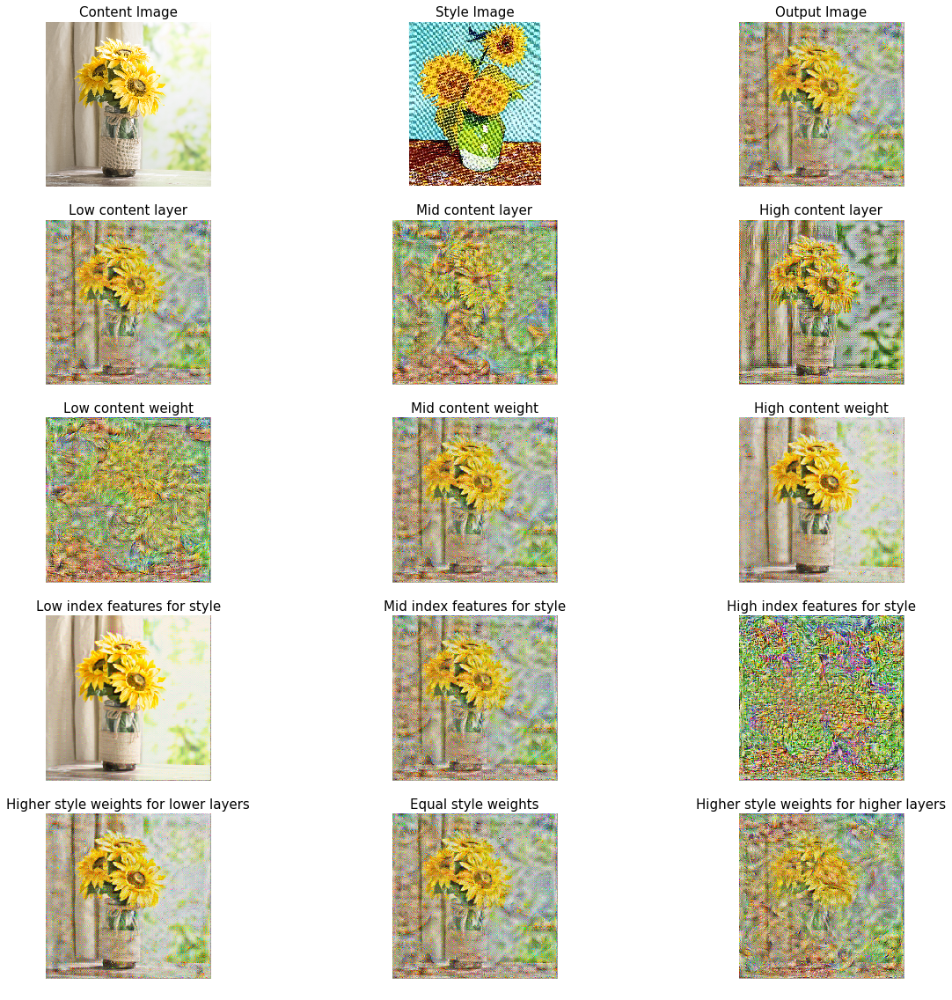

In [17]:
content_path = 'style/sunflower.jpg'
style_path = 'style/sunflowers_van_gogh.jpg'
content_im = PIL.Image.open(content_path)
style_im = PIL.Image.open(style_path)

output_im = deprocess(style_transfer(content_path, style_path, 0, 8e-4, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200))

mid_content_layer_im = style_transfer(content_path, style_path, 2, 8e-4, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200)
high_content_layer_im = style_transfer(content_path, style_path, 4, 8e-4, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200)

low_content_im = style_transfer(content_path, style_path, 0, 1e-4, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200)
high_content_im = style_transfer(content_path, style_path, 0, 5e-3, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200)

low_style_layers_im = style_transfer(content_path, style_path, 0, 8e-4, [0,1,2,3,4], [0.2, 0.2, 0.2, 0.2, 0.2], 200)
high_style_layers_im = style_transfer(content_path, style_path, 0, 8e-4, [8,9,10,11,12], [0.2, 0.2, 0.2, 0.2, 0.2], 200)

highW_highLayer_im = style_transfer(content_path, style_path, 0, 8e-4, [3,4,5,6,7], [0.05, 0.1, 0.1, 0.25, 0.5], 200)
highW_lowLayer_im = style_transfer(content_path, style_path, 0, 8e-4, [3,4,5,6,7], [0.5, 0.25, 0.1, 0.1, 0.05], 200)

# Plotting images
fig, ax = plt.subplots(5, 3, figsize=(20,20))
[axi.set_axis_off() for axi in ax.ravel()]
ax[0,0].imshow(content_im)
ax[0,0].set_title('Content Image', size=15)
ax[0,1].imshow(style_im)
ax[0,1].set_title('Style Image', size=15)
ax[0,2].imshow(output_im)
ax[0,2].set_title('Output Image', size=15)

ax[1,0].imshow(output_im)
ax[1,0].set_title('Low content layer', size=15)
ax[1,1].imshow(deprocess(mid_content_layer_im))
ax[1,1].set_title('Mid content layer', size=15)
ax[1,2].imshow(deprocess(high_content_layer_im))
ax[1,2].set_title('High content layer', size=15)

ax[2,0].imshow(deprocess(low_content_im))
ax[2,0].set_title('Low content weight', size=15)
ax[2,1].imshow(output_im)
ax[2,1].set_title('Mid content weight', size=15)
ax[2,2].imshow(deprocess(high_content_im))
ax[2,2].set_title('High content weight', size=15)

ax[3,0].imshow(deprocess(low_style_layers_im))
ax[3,0].set_title('Low index features for style', size=15)
ax[3,1].imshow(output_im)
ax[3,1].set_title('Mid index features for style', size=15)
ax[3,2].imshow(deprocess(high_style_layers_im))
ax[3,2].set_title('High index features for style', size=15)

ax[4,0].imshow(deprocess(highW_lowLayer_im))
ax[4,0].set_title('Higher style weights for lower layers', size=15)
ax[4,1].imshow(output_im)
ax[4,1].set_title('Equal style weights', size=15)
ax[4,2].imshow(deprocess(highW_highLayer_im))
ax[4,2].set_title('Higher style weights for higher layers', size=15)

Text(0.5, 1.0, 'Higher style weights for higher layers')

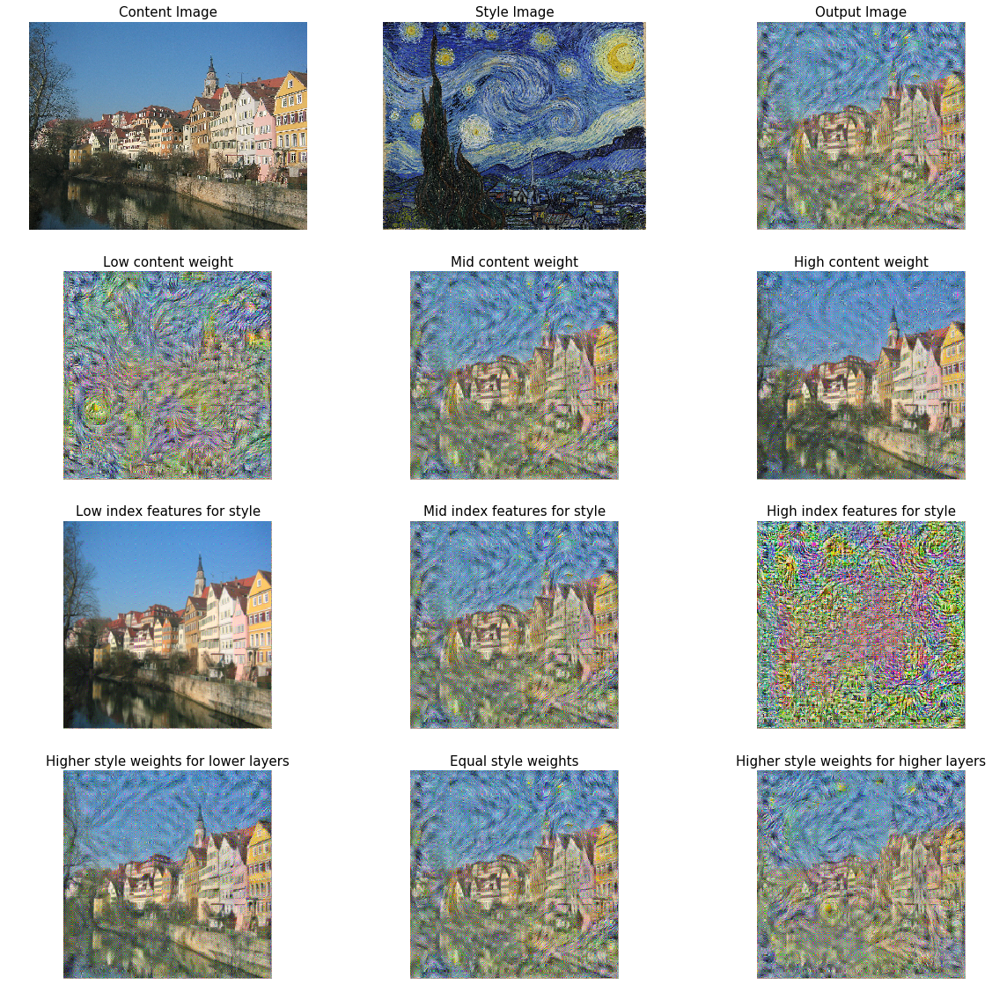

In [7]:
content_path = 'style/tubingen.jpg'
style_path = 'style/starry_night.jpg'
content_im = PIL.Image.open(content_path)
style_im = PIL.Image.open(style_path)

output_im = deprocess(style_transfer(content_path, style_path, 0, 8e-4, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200))

low_content_im = style_transfer(content_path, style_path, 0, 1e-4, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200)
high_content_im = style_transfer(content_path, style_path, 0, 5e-3, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200)

low_style_layers_im = style_transfer(content_path, style_path, 0, 8e-4, [0,1,2,3,4], [0.2, 0.2, 0.2, 0.2, 0.2], 200)
high_style_layers_im = style_transfer(content_path, style_path, 0, 8e-4, [8,9,10,11,12], [0.2, 0.2, 0.2, 0.2, 0.2], 200)

highW_highLayer_im = style_transfer(content_path, style_path, 0, 8e-4, [3,4,5,6,7], [0.05, 0.1, 0.1, 0.25, 0.5], 200)
highW_lowLayer_im = style_transfer(content_path, style_path, 0, 8e-4, [3,4,5,6,7], [0.5, 0.25, 0.1, 0.1, 0.05], 200)

# Plotting images
fig, ax = plt.subplots(4, 3, figsize=(20,20))
[axi.set_axis_off() for axi in ax.ravel()]
ax[0,0].imshow(content_im)
ax[0,0].set_title('Content Image', size=15)
ax[0,1].imshow(style_im)
ax[0,1].set_title('Style Image', size=15)
ax[0,2].imshow(output_im)
ax[0,2].set_title('Output Image', size=15)

ax[1,0].imshow(deprocess(low_content_im))
ax[1,0].set_title('Low content weight', size=15)
ax[1,1].imshow(output_im)
ax[1,1].set_title('Mid content weight', size=15)
ax[1,2].imshow(deprocess(high_content_im))
ax[1,2].set_title('High content weight', size=15)

ax[2,0].imshow(deprocess(low_style_layers_im))
ax[2,0].set_title('Low index features for style', size=15)
ax[2,1].imshow(output_im)
ax[2,1].set_title('Mid index features for style', size=15)
ax[2,2].imshow(deprocess(high_style_layers_im))
ax[2,2].set_title('High index features for style', size=15)

ax[3,0].imshow(deprocess(highW_lowLayer_im))
ax[3,0].set_title('Higher style weights for lower layers', size=15)
ax[3,1].imshow(output_im)
ax[3,1].set_title('Equal style weights', size=15)
ax[3,2].imshow(deprocess(highW_highLayer_im))
ax[3,2].set_title('Higher style weights for higher layers', size=15)

Text(0.5, 1.0, 'Higher style weights for higher layers')

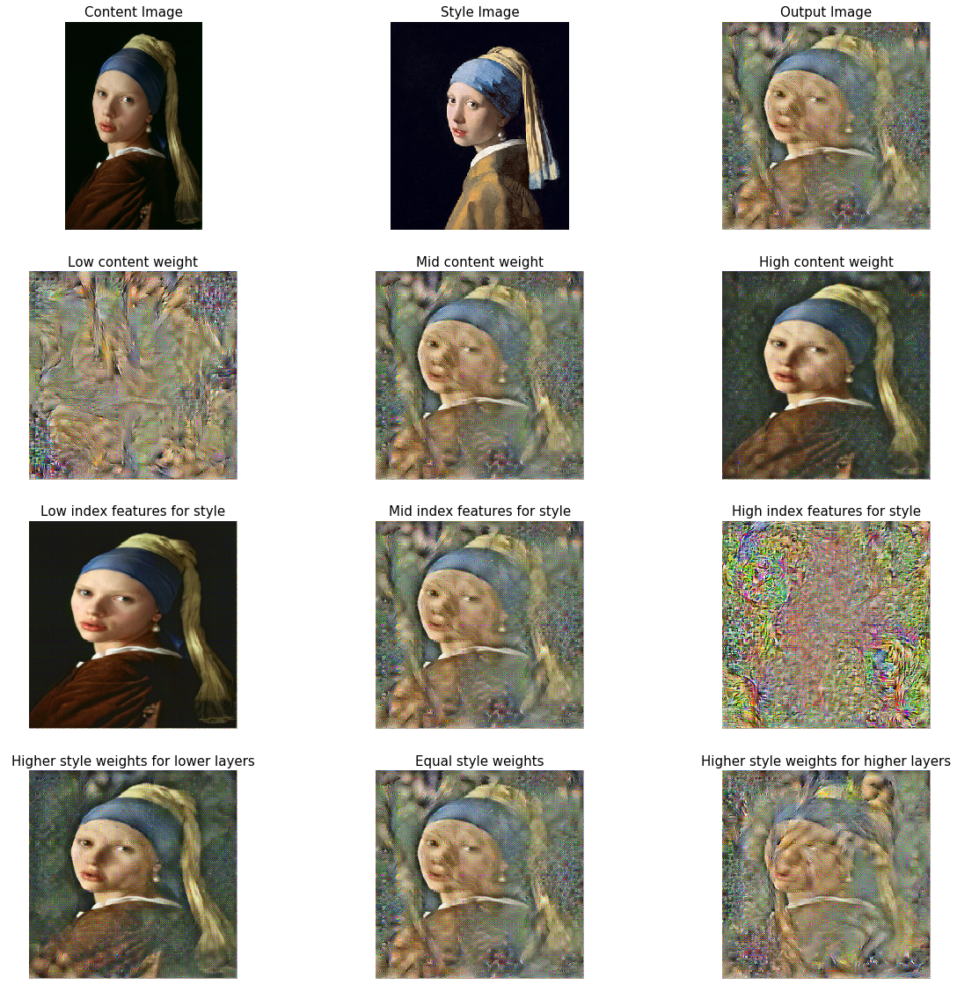

In [9]:
content_path = 'style/girl_pearl_scarlett.jpg'
style_path = 'style/girl_pearl_earring.jpg'
content_im = PIL.Image.open(content_path)
style_im = PIL.Image.open(style_path)

output_im = deprocess(style_transfer(content_path, style_path, 0, 8e-4, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200))

low_content_im = style_transfer(content_path, style_path, 0, 1e-4, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200)
high_content_im = style_transfer(content_path, style_path, 0, 5e-3, [3,4,5,6,7], [0.2, 0.2, 0.2, 0.2, 0.2], 200)

low_style_layers_im = style_transfer(content_path, style_path, 0, 8e-4, [0,1,2,3,4], [0.2, 0.2, 0.2, 0.2, 0.2], 200)
high_style_layers_im = style_transfer(content_path, style_path, 0, 8e-4, [8,9,10,11,12], [0.2, 0.2, 0.2, 0.2, 0.2], 200)

highW_highLayer_im = style_transfer(content_path, style_path, 0, 8e-4, [3,4,5,6,7], [0.05, 0.1, 0.1, 0.25, 0.5], 200)
highW_lowLayer_im = style_transfer(content_path, style_path, 0, 8e-4, [3,4,5,6,7], [0.5, 0.25, 0.1, 0.1, 0.05], 200)

# Plotting images
fig, ax = plt.subplots(4, 3, figsize=(20,20))
[axi.set_axis_off() for axi in ax.ravel()]
ax[0,0].imshow(content_im)
ax[0,0].set_title('Content Image', size=15)
ax[0,1].imshow(style_im)
ax[0,1].set_title('Style Image', size=15)
ax[0,2].imshow(output_im)
ax[0,2].set_title('Output Image', size=15)

ax[1,0].imshow(deprocess(low_content_im))
ax[1,0].set_title('Low content weight', size=15)
ax[1,1].imshow(output_im)
ax[1,1].set_title('Mid content weight', size=15)
ax[1,2].imshow(deprocess(high_content_im))
ax[1,2].set_title('High content weight', size=15)

ax[2,0].imshow(deprocess(low_style_layers_im))
ax[2,0].set_title('Low index features for style', size=15)
ax[2,1].imshow(output_im)
ax[2,1].set_title('Mid index features for style', size=15)
ax[2,2].imshow(deprocess(high_style_layers_im))
ax[2,2].set_title('High index features for style', size=15)

ax[3,0].imshow(deprocess(highW_lowLayer_im))
ax[3,0].set_title('Higher style weights for lower layers', size=15)
ax[3,1].imshow(output_im)
ax[3,1].set_title('Equal style weights', size=15)
ax[3,2].imshow(deprocess(highW_highLayer_im))
ax[3,2].set_title('Higher style weights for higher layers', size=15)

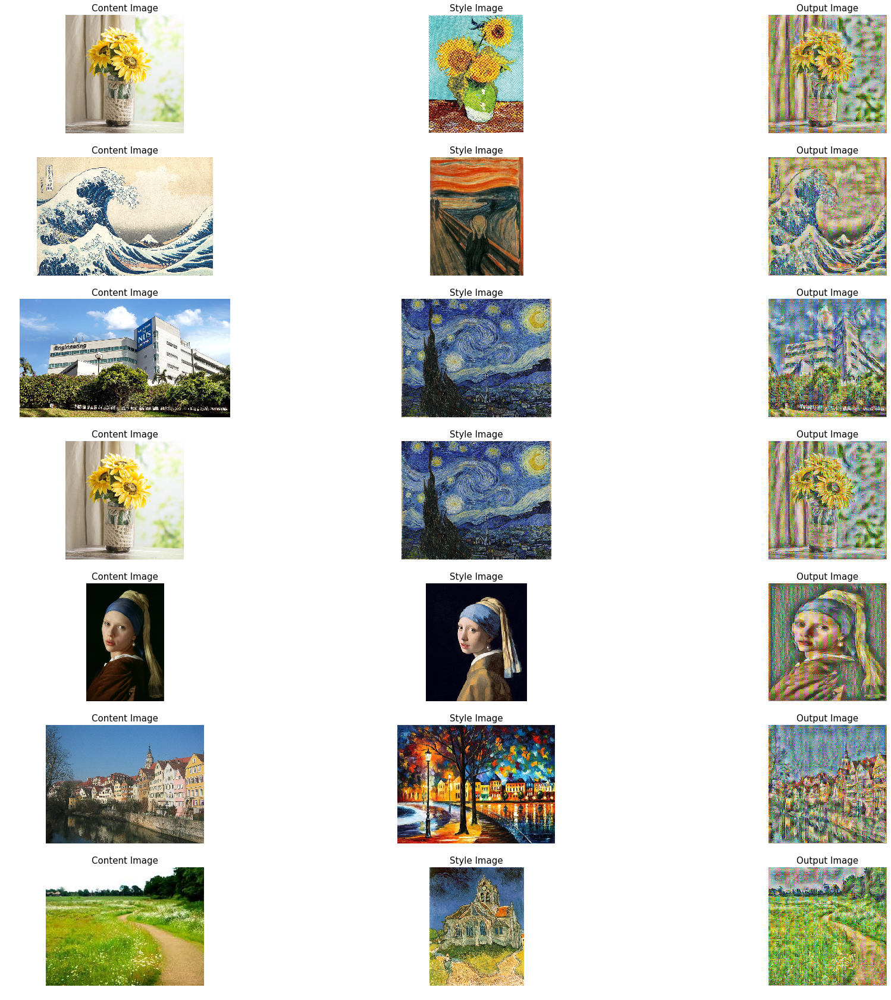

In [49]:
content_paths = ['style/sunflower.jpg','style/the_wave.jpg', 'style/engineering.jpg', 'style/sunflower.jpg', 'style/girl_pearl_scarlett.jpg',
                'style/tubingen.jpg', 'style/meadow.jpeg']
style_paths = ['style/sunflowers_van_gogh.jpg','style/the_scream.jpg', 'style/starry_night.jpg', 'style/starry_night.jpg', 'style/girl_pearl_earring.jpg',
             'style/colorful_tree.jpg', 'style/church.jpg']

fig, ax = plt.subplots(len(content_paths), 3, figsize=(30,30))
[axi.set_axis_off() for axi in ax.ravel()]
for i in range(len(content_paths)):
    content_path = content_paths[i]
    style_path = style_paths[i]

    content_im = PIL.Image.open(content_path)
    style_im = PIL.Image.open(style_path)

    output_im = deprocess(style_transfer(content_path, style_path, 4, 4e-2, [5,6,7,8,9], [0.2, 0.2, 0.2, 0.2, 0.2], 200))

    # Plotting images
    ax[i,0].imshow(content_im)
    ax[i,0].set_title('Content Image', size=15)
    ax[i,1].imshow(style_im)
    ax[i,1].set_title('Style Image', size=15)
    ax[i,2].imshow(output_im)
    ax[i,2].set_title('Output Image', size=15)

---

**Write your observations and analysis in this Markdown cell:**

---
My observations are as follows:
1. All the resulting images are a bit grainy. This is because the gradient descent acts on every pixel separately and this may change this in different directions. One way to solve this problem may be to make the model prefer smoother images by adding another loss factor.
2. The aspects of the resulting image depend on a varaiety of factors:
  -  **Choice of content layer:** A higher content layer tends to produce more merging of the two images. This is because at the higher layers the content is capturing higher level features and not just simple lines. At a lower level, we see more preservation of the content image.
  -  **Content weight / Style weight:** A higher content weight makes the resultant image look closer to the content image, and vice versa. To get a good balance, the ratio of $\frac{content weight}{style weight} = 10^{-3} to 10^{-5}$ seems to be a good compromise. A very low content weight makes the result unrecognizable, whereas a very high content weight leads to just a blurry version of the content image
  -  **Choice of style layers:** The layers at the start of the network have less style information than the layers at the end of the network. We can see this clearly in the above images becuase if we use the lower layers for styling, we hardly see any difference between the result and the content image. At higher layers, the result is able to capture higher elements of style such as strokes and complex patterns
  -  **Relative weights of style layers:** This is similar to the case above, since giving a higher weight to lower layers leads to a more subtle change in the content image. A larger weight to the later layers has a larger style infuence on the result
3. If the content image and the style image are too different from each other (eg. sunflower and starry night), then the style transfer does not work very well and the resulting image is not very visually appealing
4. If the content image and transfer image are very much similar (ex. girl with earring painting from Van gogh and a picture from the movie adaptation starring Scarlett Johanassen), we see that the optimizer tries its best to convert the content image into the style image. In this case, it tries to forcefully "turn" the head of the content image so that it matches the style image
5. The optimizer is good at copying stroke patterns. This is visible anywhere the style image is the starry night. The resulting image always tries to copy the loops in the painting. ALso in the meadow painting, the optimizer tries to copy the straight strokes present in the style input.
6. The optimizer is still bad at copying very high level features. This can be seen when content image is tubingen and style image is the colorful tree. Here, the result is just pathces of bright lights, and the optimizer is unable to copy proper aspects of the style such as the bright lights being only on background and not on the buildings, etc.

## Some good outputs

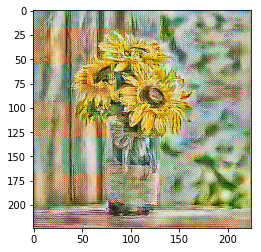

In [47]:
content_path = 'style/sunflower.jpg'
style_path = 'style/sunflowers_van_gogh.jpg'
content_im = PIL.Image.open(content_path)
style_im = PIL.Image.open(style_path)

output_im = deprocess(style_transfer(content_path, style_path, 4, 4e-2, [5,6,7,8,9], [0.2, 0.2, 0.2, 0.2, 0.2], 200))

plt.imshow(output_im)

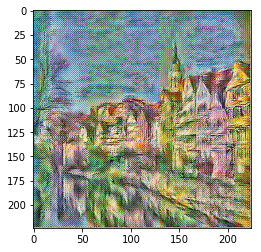

In [55]:
content_path = 'style/tubingen.jpg'
style_path = 'style/the_scream.jpg'
content_im = PIL.Image.open(content_path)
style_im = PIL.Image.open(style_path)

output_im = deprocess(style_transfer(content_path, style_path, 4, 4e-2, [5,6,7,8,9], [0.1, 0.1, 0.2, 0.3, 0.3], 200))

plt.imshow(output_im)

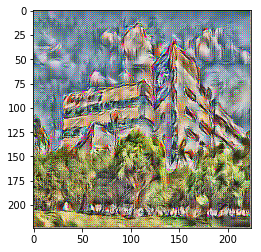

In [65]:
content_path = 'style/engineering.jpg'
style_path = 'style/abstract_art.jpg'
content_im = PIL.Image.open(content_path)
style_im = PIL.Image.open(style_path)

output_im = deprocess(style_transfer(content_path, style_path, 4, 8e-5, [3,4,5], [0.3, 0.3, 0.4], 200))

plt.imshow(output_im)

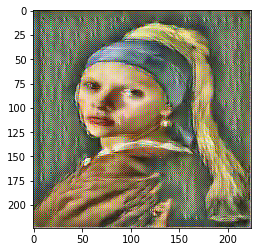

In [85]:
content_path = 'style/girl_pearl_scarlett.jpg'
style_path = 'style/girl_pearl_earring.jpg'

content_im = PIL.Image.open(content_path)
style_im = PIL.Image.open(style_path)

output_im = deprocess(style_transfer(content_path, style_path, 4, 4e-2, [4,5,6,7,8], [0.2,0.2,0.2,0.2,0.2], 200))

plt.imshow(output_im)